### 경사하강법 (Gradient Descent)

### 학습률
- 최적의 해를 빠르게 혹은 천천히 조금씩 찾아가는 '정도'를 가르키는 하이퍼 파라미터
- 기본 값으로 보통 0.001을 사용

#### 잔차제곱합 (Residual Sum of Squares, RSS)
- 잔차 = 실제 값 - 예측 값
- 잔차제곱합 = (실제 값 - 예측 값)의 제곱의 합
- 회귀 모델의 정확도를 측정하는 지표
    - RSS가 작을수록
    - RSS가 클수록

- 모든 회귀 모델은 RSS가 최소가 되는 방향으로 학습이 진행됨 = 회귀계수(절편)는 RSS가 최소가 되도록 학습
- 비용함수 R(w)가 가장 작을 떄의 w를 찾는 것이 회귀 모델의 목표
    - 매 회차에 계산된 R(w)에서 순간변화율(기울기)를 구해야 함 -> 미분 사용
    - 단, 우리가 구해야 하는 회귀계수는 하나 이상이므로 우리는 편미분을 사용함
        - w0(절편)을 고정한 채로 w1의 미분을 구하고, w1을 고정한 채로 w0 미분을 구함

### 경사하강법 공식
$ w1 = w1 - (미분값)$

$ w1 = w1 - (-학습률 * 2 / N * (x * (실제값 - 예측값))의  합)$

$ w0 = w0 - (미분값)$

$ w0 = w0 - (-학습률 * 2 / N * (실제값 - 예측값)의  합)$

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

(100, 1)
[[0.5488135 ]
 [0.71518937]
 [0.60276338]
 [0.54488318]
 [0.4236548 ]
 [0.64589411]
 [0.43758721]
 [0.891773  ]
 [0.96366276]
 [0.38344152]
 [0.79172504]
 [0.52889492]
 [0.56804456]
 [0.92559664]
 [0.07103606]
 [0.0871293 ]
 [0.0202184 ]
 [0.83261985]
 [0.77815675]
 [0.87001215]
 [0.97861834]
 [0.79915856]
 [0.46147936]
 [0.78052918]
 [0.11827443]
 [0.63992102]
 [0.14335329]
 [0.94466892]
 [0.52184832]
 [0.41466194]
 [0.26455561]
 [0.77423369]
 [0.45615033]
 [0.56843395]
 [0.0187898 ]
 [0.6176355 ]
 [0.61209572]
 [0.616934  ]
 [0.94374808]
 [0.6818203 ]
 [0.3595079 ]
 [0.43703195]
 [0.6976312 ]
 [0.06022547]
 [0.66676672]
 [0.67063787]
 [0.21038256]
 [0.1289263 ]
 [0.31542835]
 [0.36371077]
 [0.57019677]
 [0.43860151]
 [0.98837384]
 [0.10204481]
 [0.20887676]
 [0.16130952]
 [0.65310833]
 [0.2532916 ]
 [0.46631077]
 [0.24442559]
 [0.15896958]
 [0.11037514]
 [0.65632959]
 [0.13818295]
 [0.19658236]
 [0.36872517]
 [0.82099323]
 [0.09710128]
 [0.83794491]
 [0.09609841]
 [0.9764594

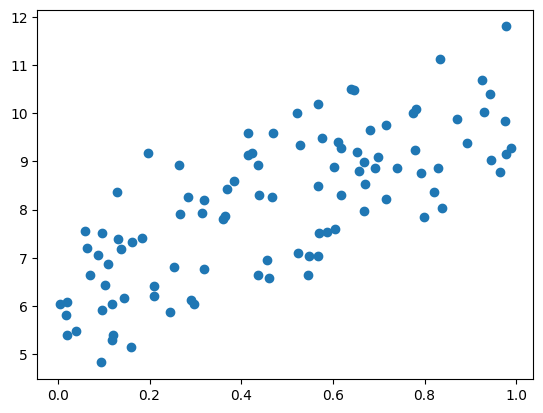

In [3]:
np.random.seed(0)

# 0 ~ 1 사이의 100개의 난수 생성
x = np.random.rand(100, 1)
print(x.shape)
print(x)

noise = np.random.randn(100, 1) #정규분포 난수를 노이즈로 사용
y = 6 + 4 * x + noise

plt.scatter(x, y)
plt.show()

In [4]:
# 경사하강법 실행

w0 = np.zeros((1, 1))
w1 = np.zeros((1, 1))

# 잔차 계산
y_pred = w0 + np.dot(x, w1) # dot : 내적 함수 (shape을 맞춰줘야 함) // 내적 : 행과 열을 곱하는 것
diff = y - y_pred

# 학습률
learning_rate = 0.01

# 데이터 개수
N = len(x)


# w0 편미분 (w0을 갱신할 값)
# w0 = w0 - (-학습률 * 2 / N * (실제값 - 예측값)의 합
w0_diff = -learning_rate * 2 / N * np.sum(diff) 
# 절편(w0) 갱신
w0 = w0 - w0_diff

# w1 편미분 (w1을 갱신할 값)
# w1 = w1 - (-학습률 * 2 / N * (x * (실제값 - 예측값))의 합
w1_diff = -learning_rate * 2 / N * np.dot(x.T, diff) # (100, 1) (100, 1)
# 가중치(w1) 갱신
w1 = w1 - w1_diff

print(f'1회 업데이트된 회귀계수 w0: {w0}, w1: {w1}')

1회 업데이트된 회귀계수 w0: [[0.16167019]], w1: [[0.08298126]]


In [15]:
def gredient_descent(X,y, learning_rate=0.01, max_iter=1000):
    # 경사하강법 실행

    # 회귀계수(가중치) 초기화
    w0 = np.zeros((1,1))
    w1 = np.zeros((1,1))

    #학습률
    # learning_rate = 0.0

    for i in range(max_iter):
        #잔차 계산
        y_pred = w0 + np.dot(X, w1)
        diff = y - y_pred

        N = len(X)

        # w0 편미분 (w0를 갱신할 값)
        w0_diff = -learning_rate * 2 / N * np.sum(diff)
        # 절편(w0) 갱신
        w0 = w0 - w0_diff

        # w1 편미분 (w1를 갱신할 값)
        # w1 = w1 - (-학습률 * 2 / N * (x * (실제값 - 예측값))의 합)
        w1_diff = - learning_rate * 2 / N * np.dot(X.T,diff)
        # 가중치(w1) 갱신
        w1 = w1- w1_diff

        # 시각화
        # plt.figure(figsize=(3, 2))
        # plt.scatter(X, y)
        # plt.plot(X, y_pred, color='red')
        # plt.show()

    return w0, w1

In [6]:
def cost_function(y_true, y_pred): 
    cost = np.sum((y_true - y_pred) ** 2) / len(y_true)
    return cost

In [16]:
w0, w1 = gredient_descent(x, y)

print('최종 회귀 계수(가중치):', w1)
print('최종 회귀 계수(절편):', w0)

최종 회귀 계수(가중치): [[3.77397397]]
최종 회귀 계수(절편): [[6.30473552]]


In [12]:
y_pred = w0 + np.dot(x, w1)
print('비용 함수 결과:', cost_function(y, y_pred))

비용 함수 결과: 0.9946766142140662


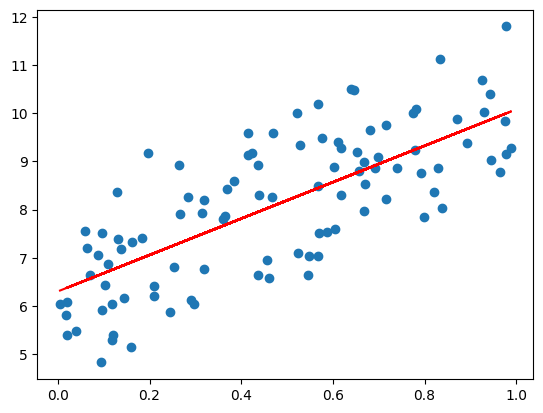

In [13]:
plt.scatter(x, y)
plt.plot(x, y_pred, color='red')
plt.show()

##### 미니 배치 경사하강법 (Mini-batch Gradient Descent)

In [20]:
def mini_batch_gradient_descent(X,y,batch_size = 10 , learning_rate=0.01, max_iter=1000):
# 회귀계수(가중치) 초기화
    w0 = np.zeros((1, 1))
    w1 = np.zeros((1, 1))

    for i in range(max_iter):
        # 미니배치 데이터 선정
        random_index = np.random.permutation(X.shape[0])
        X_sample = X[random_index[:batch_size]]
        y_sample = y[random_index[:batch_size]]

        # 잔차 계산
        y_pred = w0 + np.dot(X_sample, w1)
        diff = y_sample - y_pred

        # 데이터 개수
        N = batch_size

        # w0 편미분 (w0를 갱신할 값)
        # w0 = w0 - (-학습률 * 2 / N * (실제값 - 예측값)의 합)
        w0_diff = -learning_rate * 2 / N * np.sum(diff)
        # 절편(w0) 갱신
        w0 = w0 - w0_diff

        # w1 편미분 (w1를 갱신할 값)
        # w1 = w1 - (-학습률 * 2 / N * (x * (실제값 - 예측값))의 합)
        w1_diff = -learning_rate * 2 / N * np.dot(X_sample.T, diff)    # (100, 1) (100, 1)
        # 가중치(w1) 갱신
        w1 = w1 - w1_diff
        #시각화
        plt.figure(figsize=(3,2))
        plt.scatter(X,y)
        plt.plot(X_sample,y_pred,color='red')
        plt.show()
    return w0,w1   

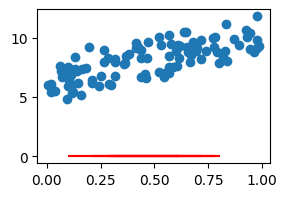

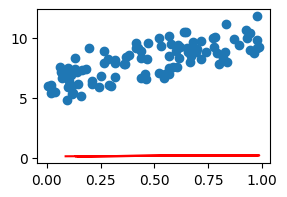

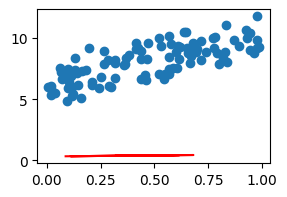

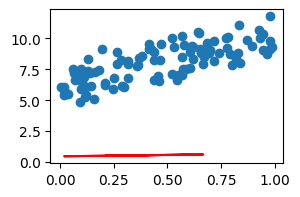

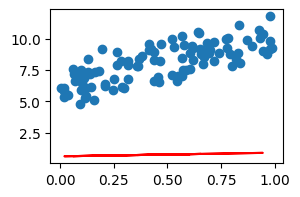

...

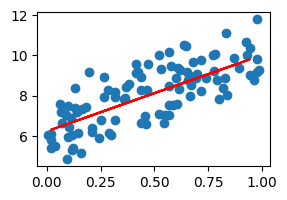

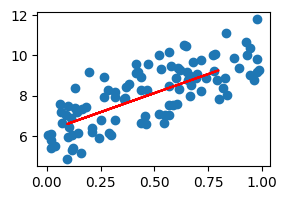

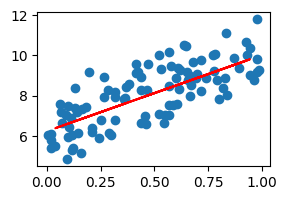

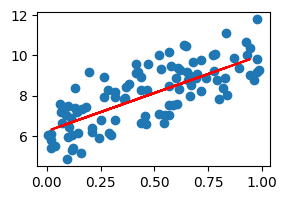

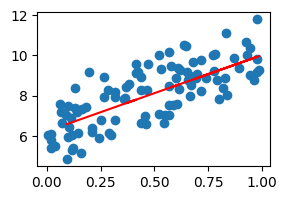

최종 회귀 계수(가중치): [[3.78240274]]
최종 회귀 계수(절편): [[6.22544021]]


In [21]:
w0, w1 = mini_batch_gradient_descent(x, y)

print('최종 회귀 계수(가중치):', w1)
print('최종 회귀 계수(절편):', w0)